# CFA SNR

If you have spent any time in astrophotography circles, you have probably seen someone say that they are considering getting a one-shot-color (OSC) camera because they want to spend less time acquiring data due to limited clear sky opportunity. It is usually at this point that they receive multiple replies informing them that, actually, they won't be saving any time with the OSC. Why? The Bayer matrix or color filter array (CFA), that insidious, inefficent abomination that steals and eats photons for breakfast.

The math is so simple. If the CFA pattern is RGGB, you are only capturing 1/4 of the red and blue photons and 1/2 of the green. So, _obviously_, for every minute you spend shooting with a R or B filter with a mono camera, you would need to spend four minutes with your OSC (or two for green) to achieve the same quality, all else being equal. As to what "quality" means exactly, it is often left as an exercise for the reader, but at some point "signal-to-noise ratio" (SNR) is identified as the metric in question. After all, when we talk about spending more time capturing data, that's what we are trying to improve. There are other measures of image quality (e.g. resolution), but they do not relate to, or be improved by, more integration time.

The problem with this simple analysis is that it is worse than completely wrong. It is wrong because that is not how SNR works. It is worse than wrong because, even if it were correct, it ignores the obvious fact that, with an OSC camera, you at least get to capture the three kinds of color data in _parallel_, which you cannot do with a single mono rig. If you really did need to spend four minutes to match one minute of R mono, that _same_ four minutes under the stars would also got you the supposed mono equivalent of one minute of B data and two minutes of G data. That is four minutes of OSC sky time to get the equivalent of...four minutes of mono sky time, by their own logic.

But because it is not the case that the SNR of OSC data has anything to do with CFA downsampling, the person considering the OSC camera was actually on the right track: they will get the benefit of that parallelism without the SNR hit. Spending four minutes shooting OSC will result in the same SNR, all else being equal, as twelve minutes of mono sky time. _It is three times faster at achieving a given SNR._ Of course, all else is not usually equal (and I will return to that later) and there is no such thing as a free lunch (which I will also return to), but those differences are separate from what people think is the most important for SNR and necessary exposure time: the simple fact that a CFA does not utilize all of the pixels when capturing any given color channel, i.e. that it downsamples each channel. The purpose of this notebook is to address that thouroughly mistaken notion and put it to rest once and for all. Then we can have an honest discussion about what mono cams _can_ do better for lack of a CFA.

In [1]:
import colour
import numpy as np
from astropy.io import fits
from colour_demosaicing import (
    demosaicing_CFA_Bayer_Menon2007,
    masks_CFA_Bayer,
    mosaicing_CFA_Bayer,
)

colour.plotting.colour_style();

We will begin with some data captured with a mono camera: a 1000 x 1000 crop of the Cave Nebula. This is stacked and stretched data but that will not matter for the analysis to follow; the data could be literally anything. The important point is that this initial data will stand in for "full" signal that has not (yet) been downsampled. If you are interested in how I captured this data and how the final (larger) final image turned out, you can see it [here](https://www.astrobin.com/0uyhda/).

In [2]:
with fits.open("RGB.fit") as R_FILE:
    RGB_MONO = R_FILE[0].data

R_MONO = RGB_MONO[0]
G_MONO = RGB_MONO[1]
B_MONO = RGB_MONO[2]

RGB_MONO = np.moveaxis(RGB_MONO, 0, 2)

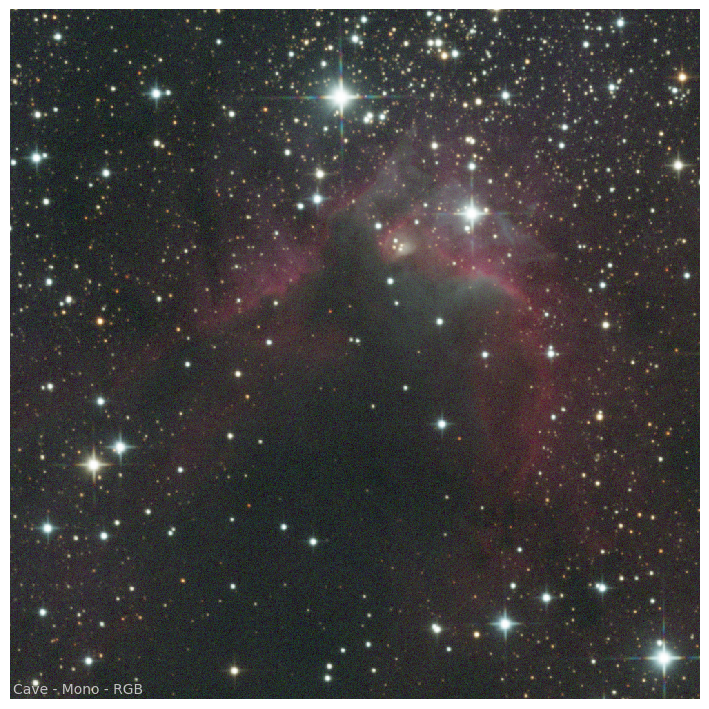

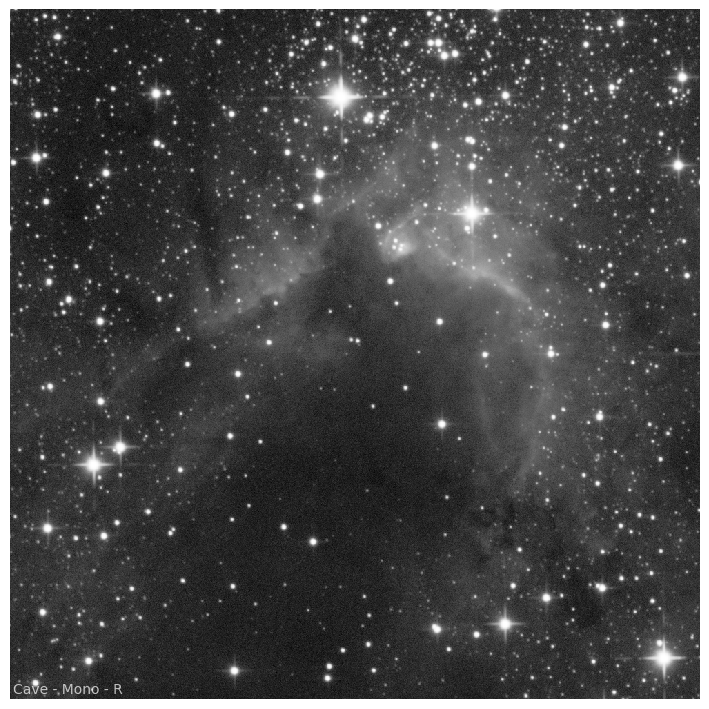

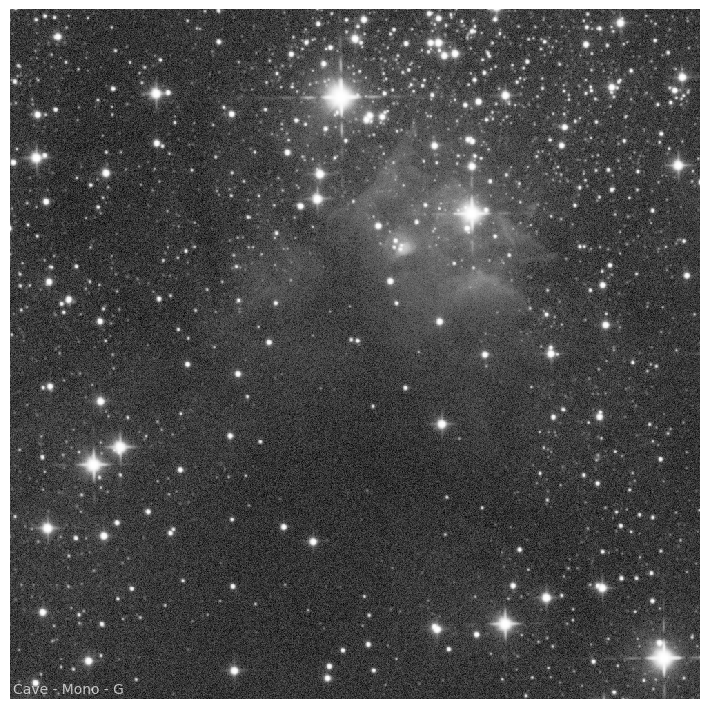

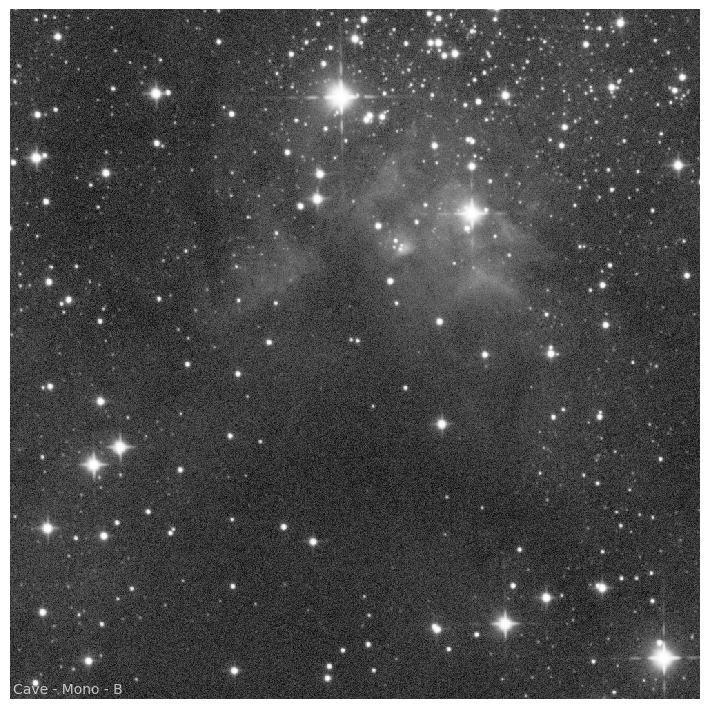

In [3]:
colour.plotting.plot_image(
    RGB_MONO,
    text_kwargs={"text": "Cave - Mono - RGB"},
)
colour.plotting.plot_image(
    R_MONO,
    text_kwargs={"text": "Cave - Mono - R"},
)
colour.plotting.plot_image(
    G_MONO,
    text_kwargs={"text": "Cave - Mono - G"},
)
colour.plotting.plot_image(
    B_MONO,
    text_kwargs={"text": "Cave - Mono - B"},
);

In [4]:
print("R Min:", np.min(R_MONO))
print("R Max:", np.max(R_MONO))
print("R Mean:", np.mean(R_MONO))
print("R Stdev:", np.std(R_MONO))
print("R SNR:", np.mean(R_MONO) / np.std(R_MONO))

R Min: 0.0308588
R Max: 1.0
R Mean: 0.225725
R Stdev: 0.105983
R SNR: 2.12983


In [5]:
print("G Min:", np.min(G_MONO))
print("G Max:", np.max(G_MONO))
print("G Mean:", np.mean(G_MONO))
print("G Stdev:", np.std(G_MONO))
print("G SNR:", np.mean(G_MONO) / np.std(G_MONO))

G Min: 0.0
G Max: 1.0
G Mean: 0.218051
G Stdev: 0.104976
G SNR: 2.07715


In [6]:
print("G Min:", np.min(B_MONO))
print("G Max:", np.max(B_MONO))
print("G Mean:", np.mean(B_MONO))
print("G Stdev:", np.std(B_MONO))
print("G SNR:", np.mean(B_MONO) / np.std(B_MONO))

G Min: 0.0
G Max: 1.0
G Mean: 0.215833
G Stdev: 0.0990254
G SNR: 2.17958


All of our SNRs are around 2. Now, we can simulate what the data would have been if there was an RGGB CFA (of the same transmission efficiency) over the sensor instead of the RGB filters used with the mono camera. It is important to understand what is happening here. We are throwing out 3/4 of the red and blue data and 1/2 of the green data permanently, replacing the values with zero.

In [7]:
R_CFA = np.where(masks_CFA_Bayer(R_MONO.shape)[0], R_MONO, 0)
print("R SNR:", np.mean(R_CFA) / np.std(R_CFA))

G_CFA = np.where(masks_CFA_Bayer(G_MONO.shape)[1], G_MONO, 0)
print("G SNR:", np.mean(G_CFA) / np.std(G_CFA))

B_CFA = np.where(masks_CFA_Bayer(B_MONO.shape)[2], B_MONO, 0)
print("B SNR:", np.mean(B_CFA) / np.std(B_CFA))

R SNR: 0.50755
G SNR: 0.826912
B SNR: 0.509889


Obviously, when you do this, you get a much lower SNR estimate. Does that make the skeptics correct? No, because this isn't a fully realized image yet. It would be silly to publish this data to argue OSC has lower SNR. The data will need to be demosaiced before we draw any conclusions.

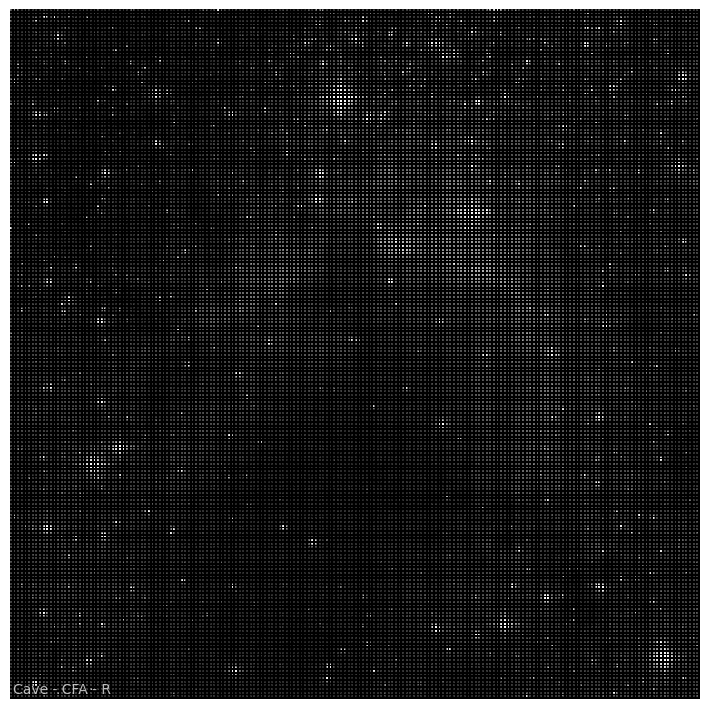

In [8]:
colour.plotting.plot_image(
    R_CFA,
    text_kwargs={"text": "Cave - CFA - R"},
);

If, instead of zero, we simply don't count the skipped pixels in the SNR calculation, we get the same SNR as the full data. In other words, the data we _did_ sample is not of a lessor quality.

In [9]:
R_CFA_NAN = np.where(masks_CFA_Bayer(R_MONO.shape)[0], R_MONO, np.nan)
print("R SNR:", np.nanmean(R_CFA_NAN) / np.nanstd(R_CFA_NAN))

R SNR: 2.12974


Let us put this data together and create our simulated OSC data as it would be before debayering (with its characteristic crosshatch pattern from the adjacency of pixels using different filters).

In [10]:
RGB = np.concatenate(
    (R_CFA[:, :, np.newaxis], G_CFA[:, :, np.newaxis], B_CFA[:, :, np.newaxis]), axis=2
)
CFA = mosaicing_CFA_Bayer(RGB)

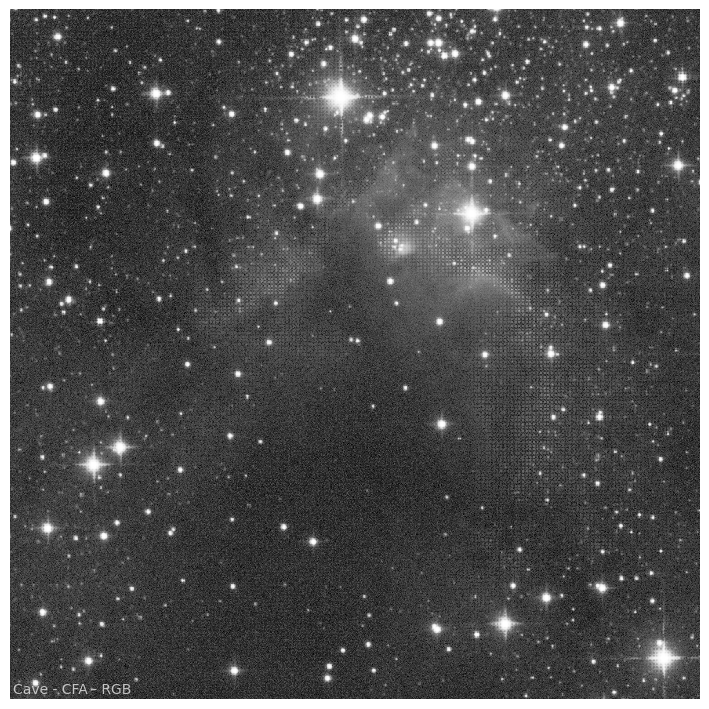

In [11]:
colour.plotting.plot_image(
    CFA,
    text_kwargs={"text": "Cave - CFA - RGB"},
);

Next, we can apply a demosaic algorithm:

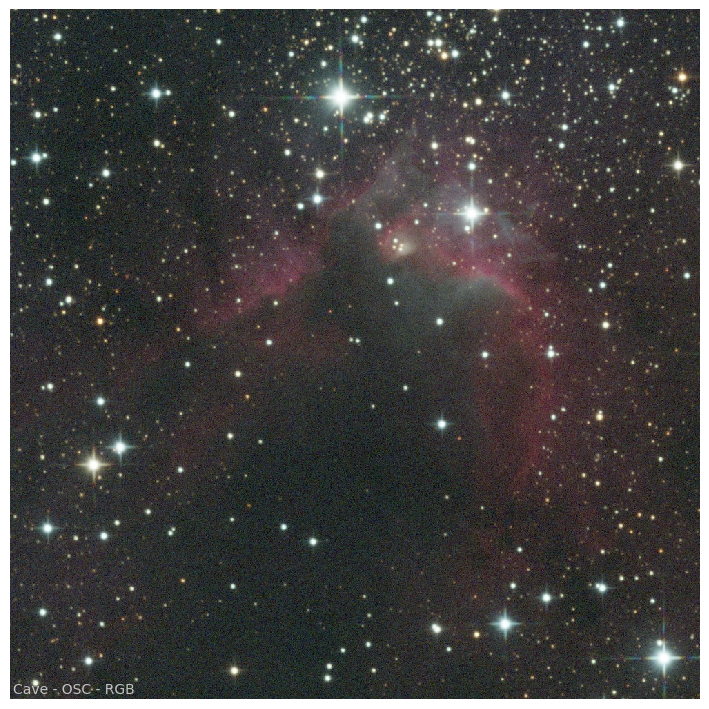

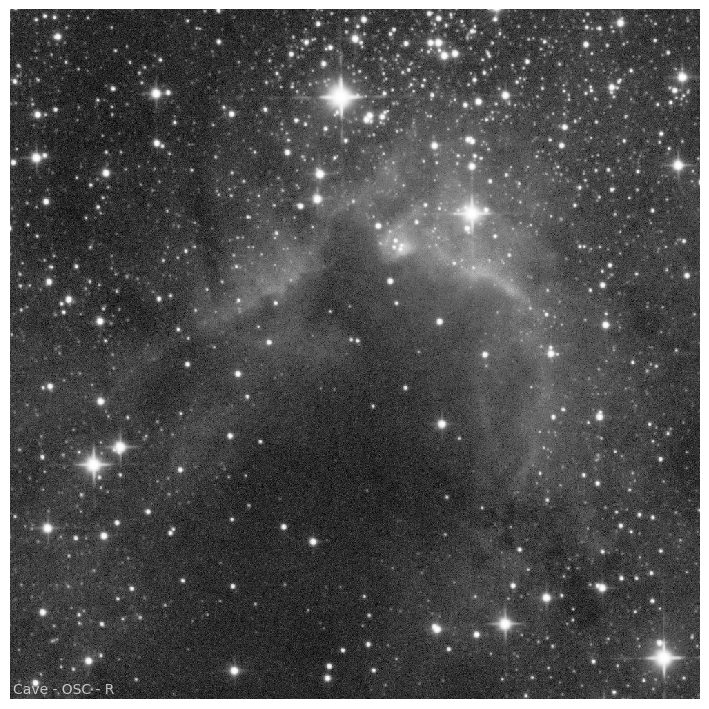

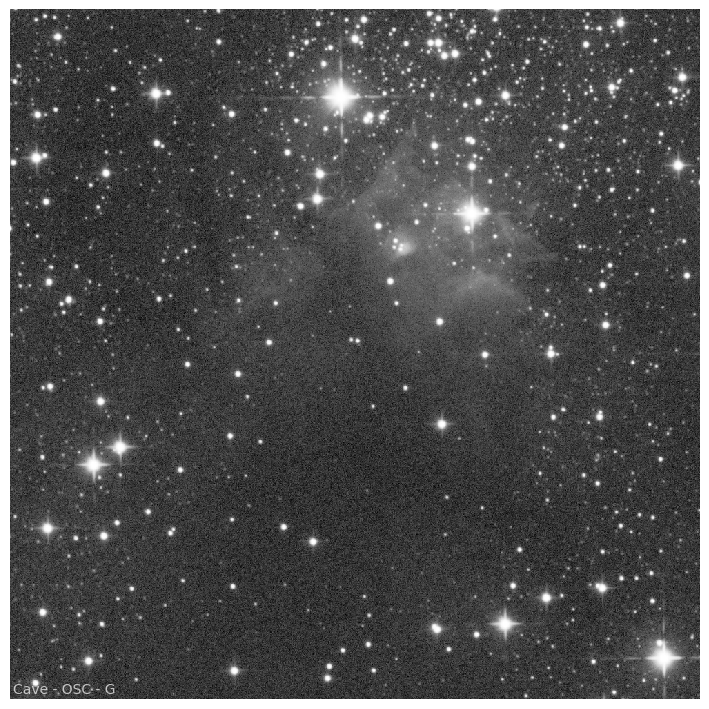

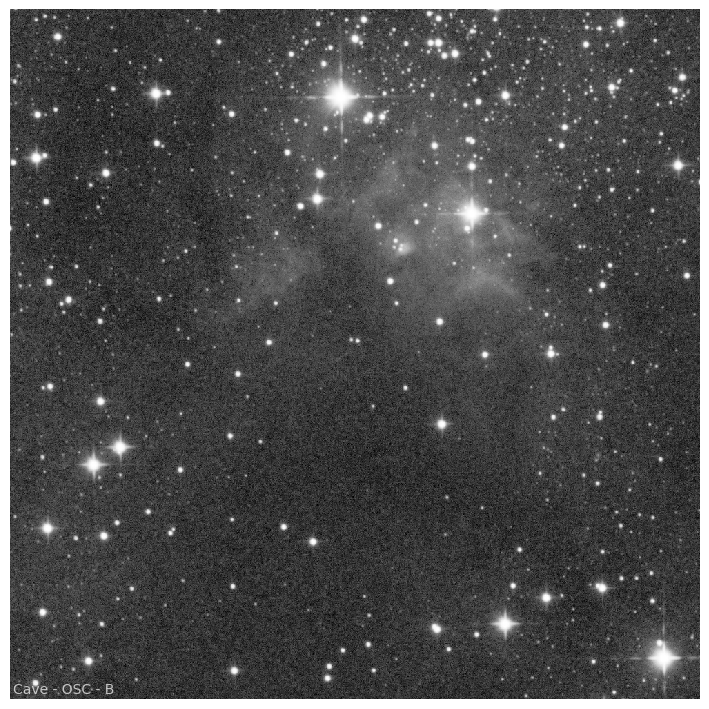

In [12]:
RGB_OSC = demosaicing_CFA_Bayer_Menon2007(CFA)
R_OSC = RGB_OSC[:, :, 0]
G_OSC = RGB_OSC[:, :, 1]
B_OSC = RGB_OSC[:, :, 2]

colour.plotting.plot_image(
    RGB_OSC,
    text_kwargs={"text": "Cave - OSC - RGB"},
)
colour.plotting.plot_image(
    R_OSC,
    text_kwargs={"text": "Cave - OSC - R"},
)
colour.plotting.plot_image(
    G_OSC,
    text_kwargs={"text": "Cave - OSC - G"},
)
colour.plotting.plot_image(
    B_OSC,
    text_kwargs={"text": "Cave - OSC - B"},
);

And now, the moment of truth. We can split the image and estimate SNR of each channel.

In [13]:
print("SNR:", np.mean(R_OSC) / np.std(R_OSC))
print("SNR:", np.mean(G_OSC) / np.std(G_OSC))
print("SNR:", np.mean(B_OSC) / np.std(B_OSC))

SNR: 2.07122572475
SNR: 2.10486109995
SNR: 2.1853626693


All of our channel SNRs are still around 2, just as the original data was before we _threw away two thirds of the information_. We can now conclude that **a CFA qua CFA does not negatively impact SNRs and so the conclusion that OSC cameras (because they use a CFA) are necessarily on the order of three times slower than monochrome cameras is definitively false.**

This really should not have been all that surprising nor should it have required all of this to demonstrate. If we just imagine, instead of downsampling with the RGGB pattern, we just had a smaller monochrome sensor that was 1/4 the original size, we would never say that we expected the sensor to be 1/4 the speed. We would naturally understand that the problem is that we are losing data to a smaller FOV, not that the data we are capturing is weaker.

Is this magic? Do we really get something for nothing? No, there is definitely a trade-off here. After all, we did throw away real data and replace it with interpolated data. Interpolated data should unquestionably be seen as less optimal than actual data from space (though modern demosaicing algorithms are _very_ good at what they do). In exchange for losing that information, the OSC user gets to obtain their data in parallel (or, if you prefer, by being able to capture in parallel, you have to give up real data for interpolated data). While it is beyond the scope of this notebook, the likely outcome is that high-frequency detail will not be accurately represent or represented at all. So in that regard, mono data is superior. But in terms of SNR (which is what the original claims purported to be about), there is not the promised degredation. In fact, the conclusion of all of this is that the combination of a lack of SNR degredation and the parallel nature of the data capture means that OSC cameras are actually three times _faster_ than mono cameras at obtaining a given SNR (i.e. reaching a given limiting magnitude) on RGB data, all else being equal.

As I said earlier, it is true, however, that all else is not usually equal. This comparison, because we wanted to isolate the effect of the CFA downsampling itself, assumed that there were no other differences between our two hypothetical systems. In practice, it probably is the case that the filters in the CFA are not comparable to the filters used in a mono filter wheel; QEs of the sensors will differ; and so on. The CFA structure itself has the potential to deflect photons. But all of these things are separate influences that have nothing to do with the downsampling inherent to a CFA per se. Their impact, even combined, is unlikely to be anywhere near the magnitude of 1/3 transmission (if you believe the results here; and you should) or 1/6 the transmission if you still cling to the idea that mono is naturally 3x faster out of the gate.

Finally, I suppose someone could argue that interpolated data might as well be noise and should be counted as such, and thereby sneaking their original claim in through the back door. To that I can only ask does the R_OSC image above _seem_ as bad as the R_CFA image? Is it really just a case of being fooled by the math?

## What about L?

At this point, this question is likely to come up. Monochrome cameras offer the undisputed advantage of being able to capture the full spectrum of visible light without downsampling any part of it through the use of UV/IR cut or L filters. This data can then be used to replace the lightness information in the final image (an LRGB image) to increase SNR with less sky time. It is true that you can not take advantage of this imaging "hack" with OSC. But remember that we have determined that, as far as time-to-SNR goes, mono is starting from behind and now, on top of that, one has to _stop_ collecting RGB data and spend time collecting L. We should expect L data to accumulate SNR at about the speed of our parallel OSC camera but the L data will _not_ contain any information about color. But as with all mono data, it will accurately preserve high frequency detail with the capabilities of the rest of the system.